# 3.2 Análisis descriptivos con `matplotlib`, `seaborn`  y `plotly`
Por: [Iván Torroledo](https://github.com/torroledo) &
[Simón Tamayo](https://github.com/simontamayo) 

### Este notebook hace parte del curso [**Capacitación de analítica avanzada**](https://github.com/Torroledo/codes-capability-building-DS-DE)

<p float="center">
  <img src="../99-imagenes/mck-logo.png" alt="drawing" width="500"/>
  <img src="../99-imagenes/matplotlib-plotly-seaborn.png" alt="drawing" width="900"/>
</p>

### Introducción 

Como parte inicial de todo proyecto de analítica avanzada el análisis exploratorio constituye el primer paso en el desarrollo de la solución. Como veremos en las proximas sesiones, a pesar de la gran complejidad de las herramientas de modelación que usaremos, no hay remplazo al entedimiento dedatallado de la información desde el punto de vista de negocio. 

En la sesión teórica vimos diferentes elementos probabilísticos y estadísticos que permiten describir los datos que usamos, por ejemplo medidas de tendencia central. Sin embargo, las herramientas visuales son herramientas poderosas para enteder patrones complejos en la data.

Veremos también que el uso de herramientas de visualización también serán de gran utilidad para la etapa final de un proyecto de analitica donde comunicamos y entregamos los resultados a diferentes audiencias. 

### Objetivos

* Entender el funcionamiento de los modulos `matplotlib`, `seaborn` y `plotly`
* Configurar los elementos gráficos de una visualización
* Conocer las visualizaciones de datos más comunes para la exploración de datos: boxplot, diagrama de dispersión, etc 
* Crear visualizaciones interactivas para la exploración de datos y la comunicación de resultados

Primero empezamos por importar las librerías que usaremos en la sesión: 

In [1]:
import matplotlib.pyplot as plt
import seaborn as sb
import plotly

import pandas as pd
import numpy as np

%matplotlib inline

Además de incluir nuestras librerías para la sesión, también incluimos un *magic command*. En nuestro caso nos permitirá instruir a la sesión interactiva de `ipython` para que todas las gráficas o visualizaciones sean mostradas en el notebook. Sin embargo, para entender esta funcionalidad a profundidad recomendamos leer [readthedocs](https://ipython.readthedocs.io/en/stable/interactive/magics.html).

### Creando nuestros datos de ejemplo

Antes de iniciar creemos un data set de muestra con el que ejemplificaremos los patrones que podemos encontrar en una aplicación

In [2]:
datos = pd.DataFrame()

# Tamaño del data set
n_size = 200

# Variables polinomiales
datos["x_1"] = np.linspace(-3.14, 3.14, n_size)
datos["x_2"] = datos["x_1"] ** 2
datos["x_3"] = datos["x_1"] ** 3
datos["x_4"] = datos["x_1"] ** 2 + np.random.normal(loc=0, scale=6, size=n_size)
datos["x_5"] = datos["x_1"] ** 3 + np.random.normal(loc=0, scale=4, size=n_size)

# Variables a partir de distribuciones
datos["x_6"] = np.random.normal(loc=0, scale=1, size=n_size)
datos["x_7"] = np.random.normal(loc=3, scale=3, size=n_size)
datos["x_8"] = np.random.lognormal(mean=2, sigma=3, size=n_size)
datos["x_9"] = np.random.uniform(low=-20, high=20, size=n_size)
datos["x_10"] = np.random.exponential(scale=10, size=n_size)

# Variables senosoidales
datos["x_11"] = np.sin(datos["x_1"]) 
datos["x_12"] = np.cos(datos["x_1"])
datos["x_13"] = np.sin(0.2*datos["x_1"])
datos["x_14"] = np.sin(datos["x_1"]) + np.random.normal(loc=0, scale=.2, size=n_size)
datos["x_15"] = np.cos(2*datos["x_1"]) + np.random.normal(loc=0, scale=.1, size=n_size)

# Variables categóricas
datos["x_16"] = (datos["x_15"]*1.5).astype(int)
datos["x_17"] = np.random.randint(5,size=n_size)

datos.head()

,x_1,x_2,x_3,x_4,x_5,x_6,x_7,x_8,x_9,x_10,x_11,x_12,x_13,x_14,x_15,x_16,x_17
0,-3.140000,9.859600,-30.959144,-1.666491,-32.701805,0.055036,5.955792,30.055757,-9.266083,9.209561,-0.001593,-0.999999,-0.587528,0.039306,1.060629,1,0
1,-3.108442,9.662413,-30.035052,11.455505,-25.003412,1.848359,9.189615,0.668230,6.855690,11.559003,-0.033144,-0.999451,-0.582409,-0.043594,0.994754,1,1
2,-3.076884,9.467218,-29.129535,12.810626,-26.093938,0.744293,1.634846,0.381529,11.118459,32.794004,-0.064663,-0.997907,-0.577266,-0.062627,0.932660,1,1
3,-3.045327,9.274014,-28.242403,-3.894007,-27.495738,-0.376385,6.763260,22.723248,-9.787495,6.829539,-0.096117,-0.995370,-0.572101,-0.007596,1.142285,1,4
4,-3.013769,9.082803,-27.373468,2.721521,-34.835459,-0.803730,1.905995,1517.604004,-7.642639,11.529393,-0.127476,-0.991842,-0.566913,-0.698984,1.113298,1,4


## `matplotlib`

Al igual que **Numpy** es la libreria *default* para el trabajo con estrcuturas matriciales, **[Matplotlib](https://matplotlib.org/3.2.1/contents.html)** es la librería por *default* para visualización de datos en **Python**. Sobre esta libería se construyen otras que responden a tareas particulares como **Pandas** o **Seaborn**. En particular veremos el módulo **`pyplot`**. Si deseas conocer en detalle sobre la documentación y funcionamiento del *API*, recomendamos leer: https://matplotlib.org/3.2.1/api/index.html

### Histogramas - `hist`

La mejor forma de empezar la exploración de un nuevo conjunto de datos es conociendo las distribuciones empíricas de los datos. Por ejemplo, si queremos queremos conocer el histograma de una variable particular podemos usar:

(array([ 1.,  3.,  5.,  8., 23., 44., 48., 35., 21., 12.]),
 array([-3.53577803, -2.98590863, -2.43603924, -1.88616984, -1.33630044,
        -0.78643104, -0.23656164,  0.31330775,  0.86317715,  1.41304655,
         1.96291595]),
 <a list of 10 Patch objects>)

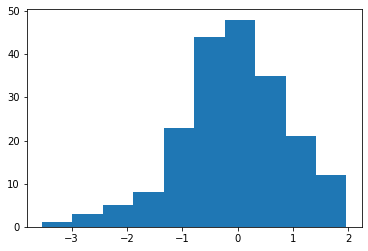

In [3]:
plt.hist(datos["x_6"])

Aquí observamos la salida por defecto para nuestra visualización. Notamos algunas aspectos de mejora como: el tamaño de la gráfica, el número de *bins*, o la impresión de los arreglos de datos al tope de la figura. Para corregir esto y personalizar nuestra figura podemos:

1. Definir una figura de marco para la visualización
2. Ajustar el tamaño de la figura 
3. Cambiar el color del histograma
4. Ajustar el número de *bins*
5. Crear una cuadricula para visualizar mejor los valores de referencia
6. Finalizar con la instruccion `show` para que se muestre toda visualización y no los arreglos de datos del histograma

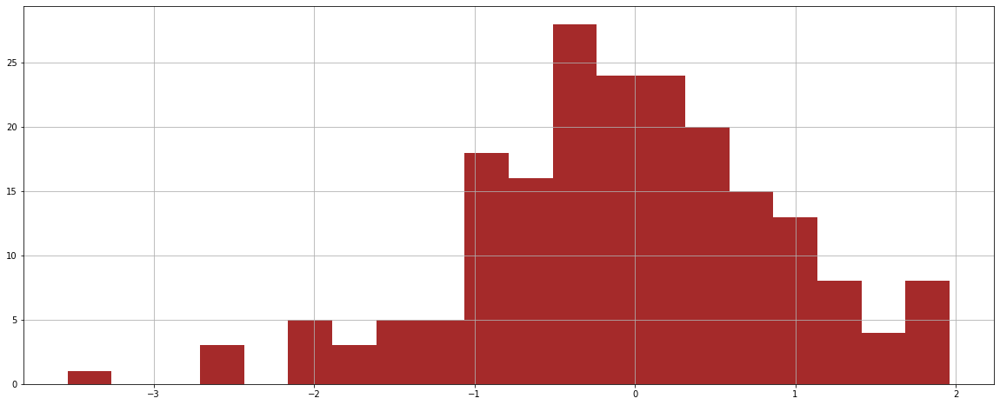

In [4]:
fig = plt.figure(figsize=(20,8))
plt.hist(datos['x_6'],bins=20,color='brown')
plt.grid()
plt.show()

Para seguir con la personalización, ahora podemos incluir legendas a nuestros ejes: 

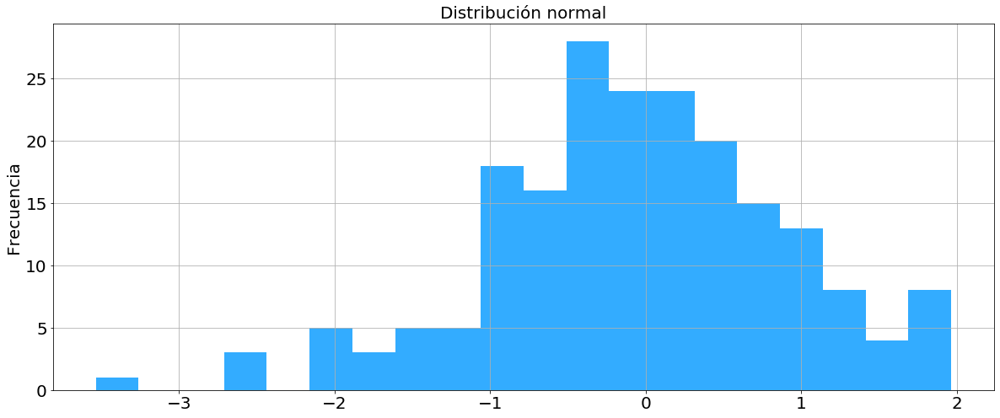

In [5]:
fig = plt.figure(figsize=(20,8))
plt.hist(datos['x_6'],bins=20,color='#33ACFF')

plt.title('Distribución normal',fontsize=20)
plt.ylabel('Frecuencia',fontsize=20)

plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.grid()
plt.show()


En ocasiones queremos comparar distribuciones dos variables con significado y unidades similares, luego podemos incluir ambos histogramas en la misma figura:

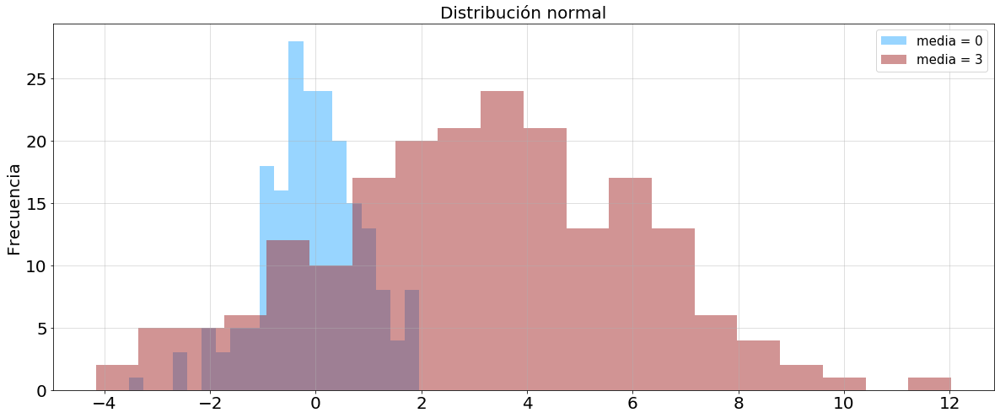

In [6]:
fig = plt.figure(figsize=(20,8))

plt.hist(datos['x_6'],bins=20,color='#33ACFF',alpha=0.5,label='media = 0')
plt.hist(datos['x_7'],bins=20,color='brown',alpha=0.5,label='media = 3')

plt.title('Distribución normal',fontsize=20)
plt.ylabel('Frecuencia',fontsize=20)
plt.legend(fontsize=15)

plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

# plt.xlim(-1,2)
plt.grid(alpha=0.5)
plt.show()


Aquí incluimos un poco de transparencia a los dos histogramas de cada variable para ver el comportamiento cuando las dos funciones se sobreponen. Ahora que comparamos histogramas, si normalizamos histograma, podemos usar esta visualización para comparar las distribuciones de probabilidad:

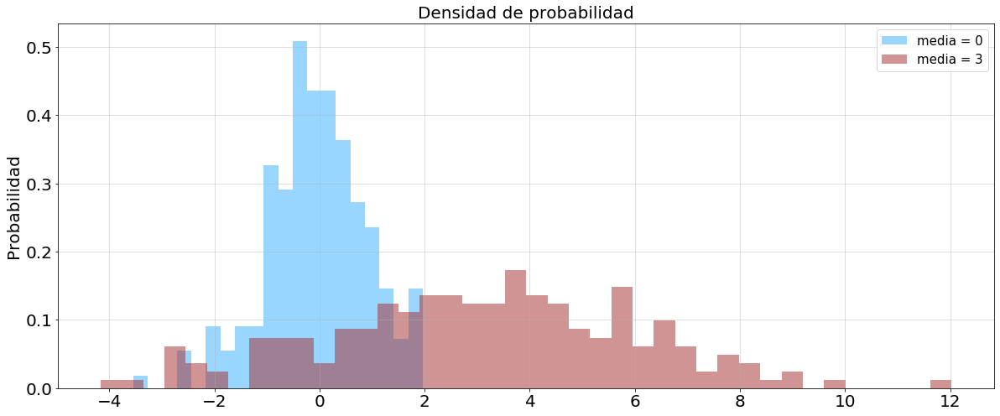

In [7]:
fig = plt.figure(figsize=(20,8))

plt.hist(datos['x_6'],bins=20,color='#33ACFF',density=True,alpha=0.5,label='media = 0')
plt.hist(datos['x_7'],bins=40,color='brown',density=True,alpha=0.5,label='media = 3')

plt.title('Densidad de probabilidad',fontsize=20)
plt.ylabel('Probabilidad',fontsize=20)
plt.legend(fontsize=15)

plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.grid(alpha=0.5)

plt.show()


Otrs forma de representar los histogramas es:

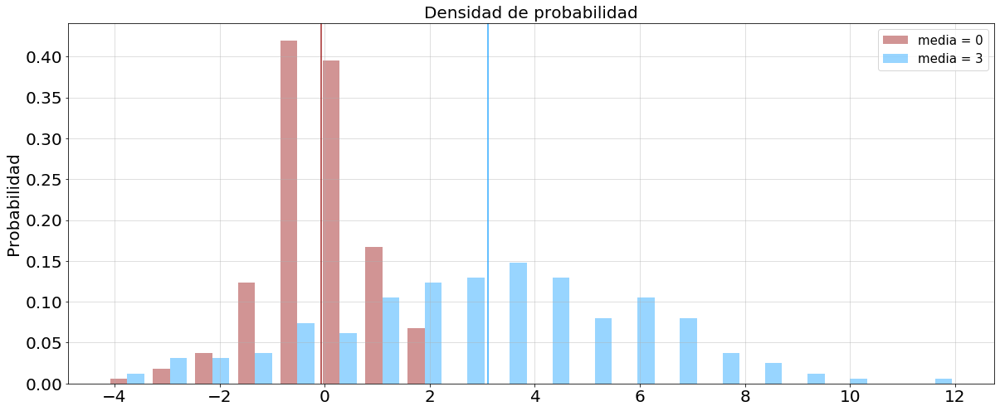

In [8]:
fig_histograma = plt.figure(figsize=(20,8))

plt.hist([datos['x_6'],datos['x_7']],bins=20,color=['brown','#33ACFF'],density=True,alpha=0.5,label=['media = 0','media = 3'])
plt.axvline(datos['x_6'].mean(),color='brown')
plt.axvline([datos['x_7'].mean()],color='#33ACFF',label='')

plt.title('Densidad de probabilidad',fontsize=20)
plt.ylabel('Probabilidad',fontsize=20)
plt.legend(fontsize=15)

plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

# plt.xlim(-1,400)
plt.grid(alpha=0.5)
plt.show()


Con la función `axvline` (`axhline`) podemos graficar líneas verticales (horizontales) cuando deseemos. En nuestro caso funciona para referenciar el valor promedio de cada distribución. 

### Gráfico de líneas - `plot`

Cuando se trata de información dinámica, por ejemplo que evoluciona en el tiempo, los histogramas previos tienen limitaciones para que podamos entender este comportamiento. Este es el caso de uso perfecto para las gráficas de líneas.

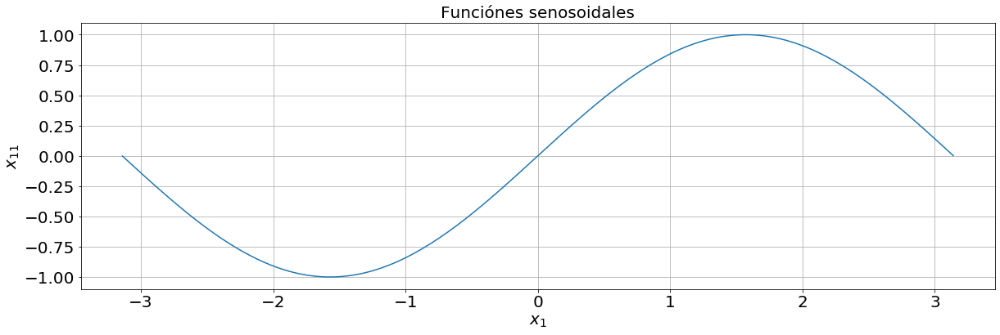

In [9]:
fig = plt.figure(figsize=(20,6))

plt.plot(datos['x_1'],datos['x_11'])

plt.title('Funciónes senosoidales',fontsize=20)
plt.ylabel('$x_{11}$',fontsize=20)
plt.xlabel('$x_1$',fontsize=20)

plt.yticks(fontsize=20)
plt.xticks(fontsize=20)

plt.grid()

plt.show()

En ocasiones queremos personalizar aún más nuestras figuras por lo que podemos recurrir a los estilos predefinidos de `matplotlib`. Uno muy usado debido a la popularidad de su origen es el estilo que replica el aspecto de la librería `ggplot` de `R`:

In [10]:
plt.style.use('ggplot')

Ahora al ejecutar la misma gráfica tendremos que nuestro estilo ha cambiado:

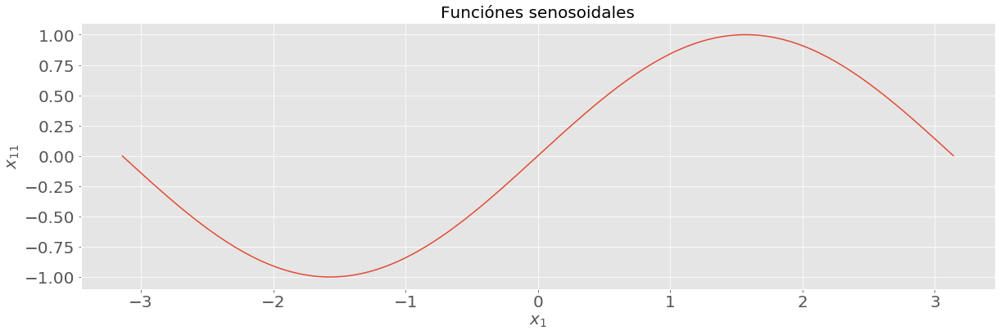

In [11]:
fig = plt.figure(figsize=(20,6))

plt.plot(datos['x_1'],datos['x_11'])

plt.title('Funciónes senosoidales',fontsize=20)
plt.ylabel('$x_{11}$',fontsize=20)
plt.xlabel('$x_1$',fontsize=20)

plt.yticks(fontsize=20)
plt.xticks(fontsize=20)

plt.show()

Si queremos comparar dos series temporales en el mismo grafico, simplemente la agregregamos a al figura: 

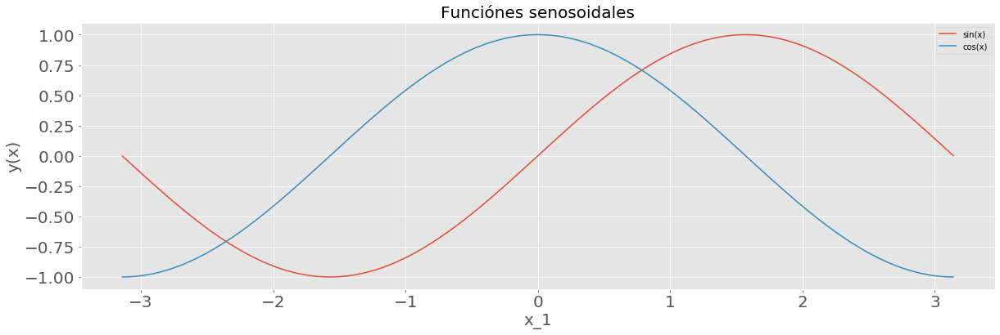

In [12]:
fig = plt.figure(figsize=(20,6))

plt.plot(datos['x_1'],datos['x_11'],label='sin(x)')
plt.plot(datos['x_1'],datos['x_12'],label='cos(x)')

plt.title('Funciónes senosoidales',fontsize=20)
plt.ylabel('y(x)',fontsize=20)
plt.xlabel('x_1',fontsize=20)

plt.yticks(fontsize=20)
plt.xticks(fontsize=20)

plt.legend()

plt.show()

Si queremos hacer más fácil la lectura del diagrama, `matplotlib` permite personalizar el grosor y tipo de línea, además de incluir marcadores para referenciar cada punto de la data:

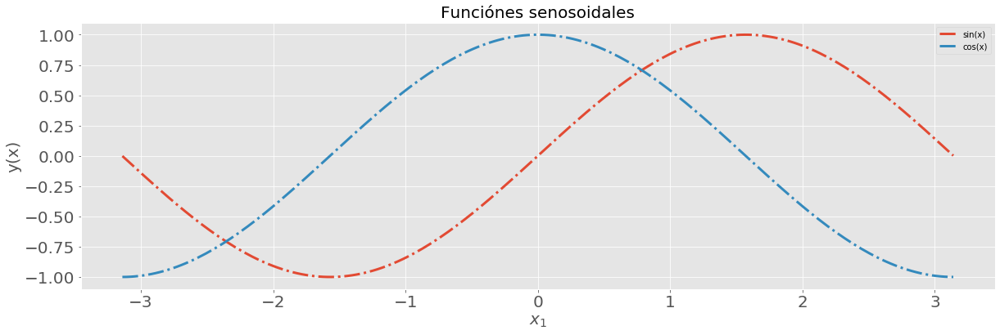

In [13]:
fig = plt.figure(figsize=(20,6))

plt.plot(datos['x_1'],datos['x_11'],label='sin(x)',linewidth=3,linestyle='-.')
plt.plot(datos['x_1'],datos['x_12'],label='cos(x)',linewidth=3,linestyle='-.')

plt.title('Funciónes senosoidales',fontsize=20)
plt.ylabel('y(x)',fontsize=20)
plt.xlabel('$x_1$',fontsize=20)

plt.yticks(fontsize=20)
plt.xticks(fontsize=20)

plt.legend()

plt.show()

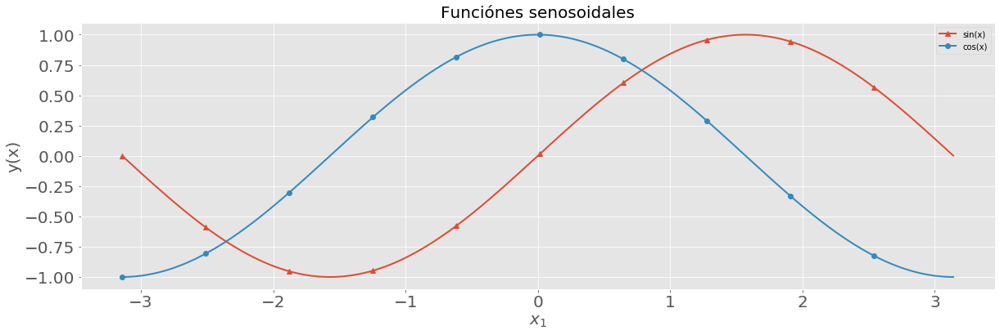

In [14]:
fig_lineas = plt.figure(figsize=(20,6))

plt.plot(datos['x_1'],datos['x_11'],label='sin(x)',linewidth=2,marker='^',markevery=20)
plt.plot(datos['x_1'],datos['x_12'],label='cos(x)',linewidth=2,marker='o',markevery=20)

plt.title('Funciónes senosoidales',fontsize=20)
plt.ylabel('y(x)',fontsize=20)
plt.xlabel('$x_1$',fontsize=20)

plt.yticks(fontsize=20)
plt.xticks(fontsize=20)

plt.legend()

plt.show()

### Diagramas de dispersión - `scatter` 

Un diagrama de dispersión muestra de forma visual el nivel de variación conjunta entre pares de variables:

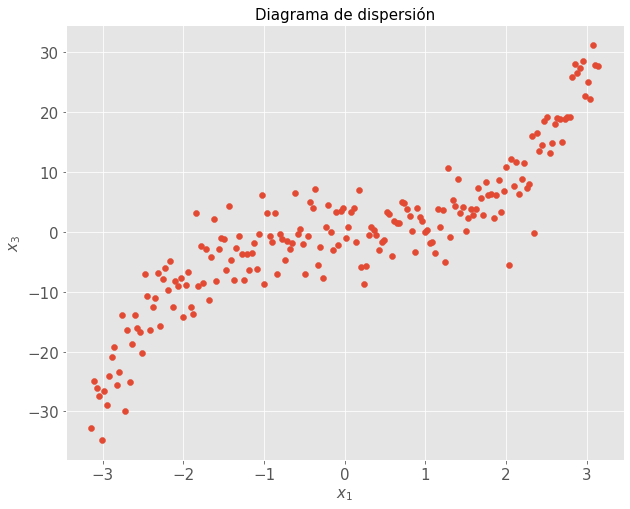

In [15]:
fig = plt.figure(figsize=(10,8))

plt.scatter(datos['x_1'],datos['x_5'])

plt.title('Diagrama de dispersión',fontsize=15)
plt.xlabel('$x_1$',fontsize=15)
plt.ylabel('$x_3$',fontsize=15)

plt.yticks(fontsize=15)
plt.xticks(fontsize=15)

plt.show()

Podemos agregar transparencia al gráfico para facilitar la lectura cuando hay muchos datos:

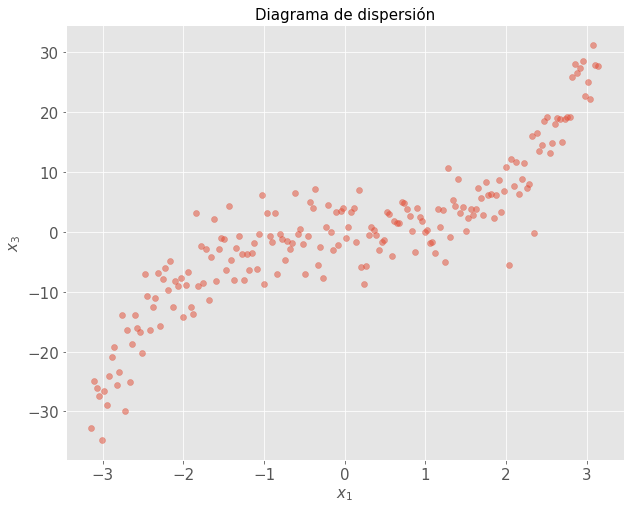

In [16]:
fig = plt.figure(figsize=(10,8))

plt.scatter(datos['x_1'],datos['x_5'],alpha=0.5)

plt.title('Diagrama de dispersión',fontsize=15)
plt.xlabel('$x_1$',fontsize=15)
plt.ylabel('$x_3$',fontsize=15)

plt.yticks(fontsize=15)
plt.xticks(fontsize=15)

plt.show()

También podemos personalizar el gráfico cambiando ya sea el color, tamaño o forma de los puntos en el diagrama:

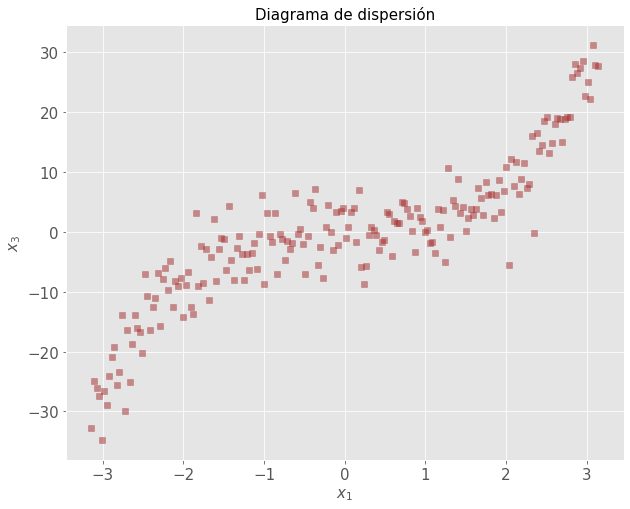

In [17]:
fig = plt.figure(figsize=(10,8))

plt.scatter(datos['x_1'],datos['x_5'],alpha=0.5,marker='s',facecolor='brown',s=40)

plt.title('Diagrama de dispersión',fontsize=15)
plt.xlabel('$x_1$',fontsize=15)
plt.ylabel('$x_3$',fontsize=15)

plt.yticks(fontsize=15)
plt.xticks(fontsize=15)

plt.show()

Igualmente, tanto color como tamaño de los puntos pueden ser utilizados para representar una tercera dimensión de la información en nuestro conjunto de datos:

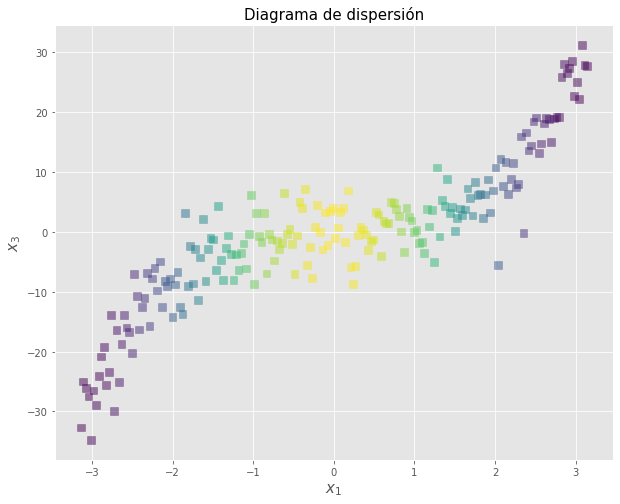

In [18]:
fig = plt.figure(figsize=(10,8))

plt.scatter(datos['x_1'],datos['x_5'],alpha=0.5,marker='s',facecolor='brown',s=60,c=datos['x_12'])

plt.title('Diagrama de dispersión',fontsize=15)
plt.xlabel('$x_1$',fontsize=15)
plt.ylabel('$x_3$',fontsize=15)

plt.show()

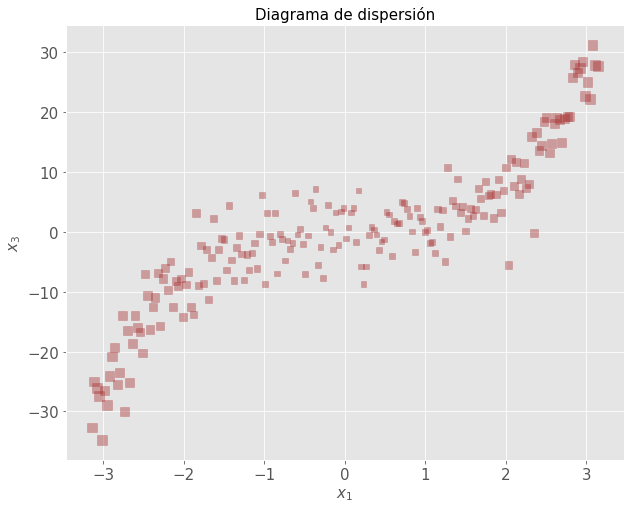

In [19]:
fig_dispersion = plt.figure(figsize=(10,8))

plt.scatter(datos['x_1'],datos['x_5'],alpha=0.4,marker='s',facecolor='brown',cmap='gist_ncar',s=datos['x_2']*7+30,c='brown')

plt.title('Diagrama de dispersión',fontsize=15)
plt.xlabel('$x_1$',fontsize=15)
plt.ylabel('$x_3$',fontsize=15)

plt.yticks(fontsize=15)
plt.xticks(fontsize=15)

plt.show()

### Subplots 

Hasta el momento hemos visto figuras con solo una visualización. Sin embargo, podemos crear figuras más complejas usando `sublplots`. Un caso de uso común son las gráficas con ejes compartidos:

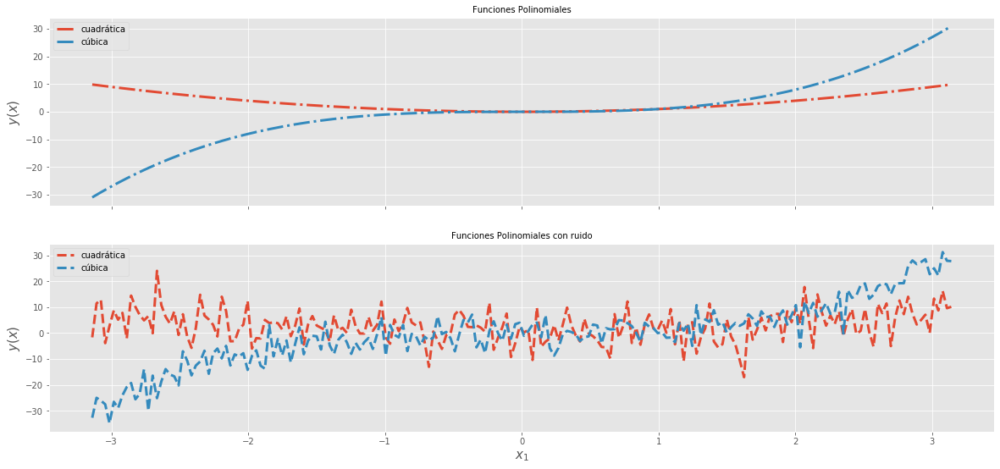

In [20]:
f, (ax1, ax2) = plt.subplots(2, 1, sharex=True,figsize=(20,9))

# Gráfica 1
ax1.plot(datos['x_1'],datos['x_2'],label='cuadrática',linewidth=3,linestyle='-.')
ax1.plot(datos['x_1'],datos['x_3'],label='cúbica',linewidth=3,linestyle='-.')

ax1.set_title('Funciones Polinomiales',fontsize=10)
ax1.set_ylabel('$y(x)$',fontsize=15)

ax1.legend()

# Gráfica 2

ax2.plot(datos['x_1'],datos['x_4'],label='cuadrática',linewidth=3,linestyle='--')
ax2.plot(datos['x_1'],datos['x_5'],label='cúbica',linewidth=3,linestyle='--')

ax2.set_title('Funciones Polinomiales con ruido',fontsize=10)
ax2.set_ylabel('$y(x)$',fontsize=15)
ax2.set_xlabel('$x_1$',fontsize=15)

ax2.legend()

plt.show()

También podemos generar figuras con gráficas heterogeneas:

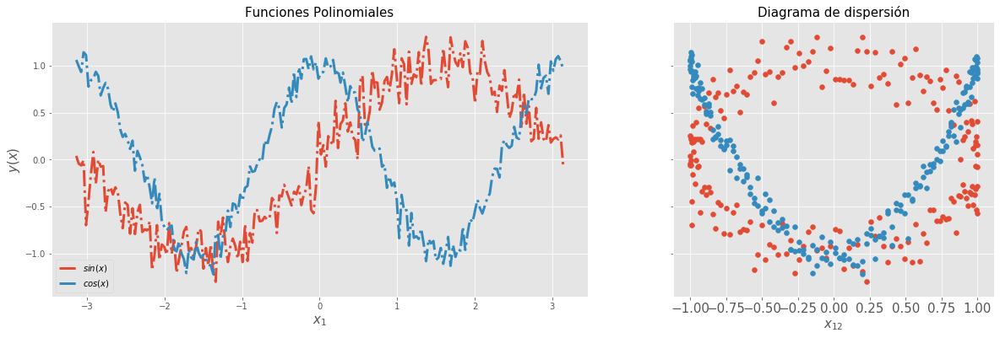

In [21]:
f, (ax1, ax2) = plt.subplots(1, 2, sharey=True,figsize=(20,6),
                             gridspec_kw={'width_ratios': [5,3]}
                            )

# Gráfica 1
ax1.plot(datos['x_1'],datos['x_14'],label='$sin(x)$',linewidth=3,linestyle='-.')
ax1.plot(datos['x_1'],datos['x_15'],label='$cos(x)$',linewidth=3,linestyle='-.')

ax1.set_title('Funciones Polinomiales',fontsize=15)
ax1.set_ylabel('$y(x)$',fontsize=15)
ax1.set_xlabel('$x_1$',fontsize=15)

ax1.legend()

# Gráfica 2
plt.scatter(datos['x_12'],datos['x_14'])
plt.scatter(datos['x_12'],datos['x_15'])

plt.title('Diagrama de dispersión',fontsize=15)
plt.xlabel('$x_{12}$',fontsize=15)

plt.yticks(fontsize=15)
plt.xticks(fontsize=15)

plt.show()

### Añadiendo texto a las gráficas

Otra herramienta para aumentar la personalización de cada figura es incluir texto: 

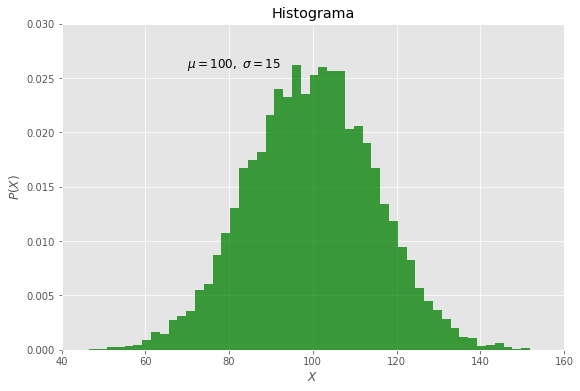

In [22]:
# Creemos datos de muestra
mu, sigma = 100, 15
x = mu + sigma * np.random.randn(10000)

# Creemos 
fig = plt.figure(figsize=(9,6))
n, bins, patches = plt.hist(x, 50, density=True, facecolor='g', alpha=0.75)

plt.xlabel('$X$')
plt.ylabel('$P(X)$')
plt.title('Histograma')
plt.text(70, .026, r'$\mu=100,\ \sigma=15$',fontsize=12)
plt.axis([40, 160, 0, 0.03])
plt.grid(True)

### ¿Cómo guardar las figuras?

Finalmente, todo el trabajo puede ser guardado para luego ser compartido:

In [23]:
fig.savefig('distribucion_normal.png', facecolor='none')

Esta figura se guardará en el folder:

In [24]:
!ls

2.4-Introduccion_a_python.ipynb
2.5-Introduccion_a_pandas.ipynb
3.2-Exploracion_de_datos_con_matplotlib_seaborn_plotly-Copy1.ipynb
3.2-Exploracion_de_datos_con_matplotlib_seaborn_plotly.ipynb
Untitled.ipynb
distribucion_normal.png


Pero ya que lo verificamos, podemos borrarla:

In [25]:
!rm distribucion_normal.png

In [26]:
!ls

2.4-Introduccion_a_python.ipynb
2.5-Introduccion_a_pandas.ipynb
3.2-Exploracion_de_datos_con_matplotlib_seaborn_plotly-Copy1.ipynb
3.2-Exploracion_de_datos_con_matplotlib_seaborn_plotly.ipynb
Untitled.ipynb


### Figuras 3D

Ahora, cuando queremos representar información con dimensionalidad mayor, podemos usar figuras **3D**:

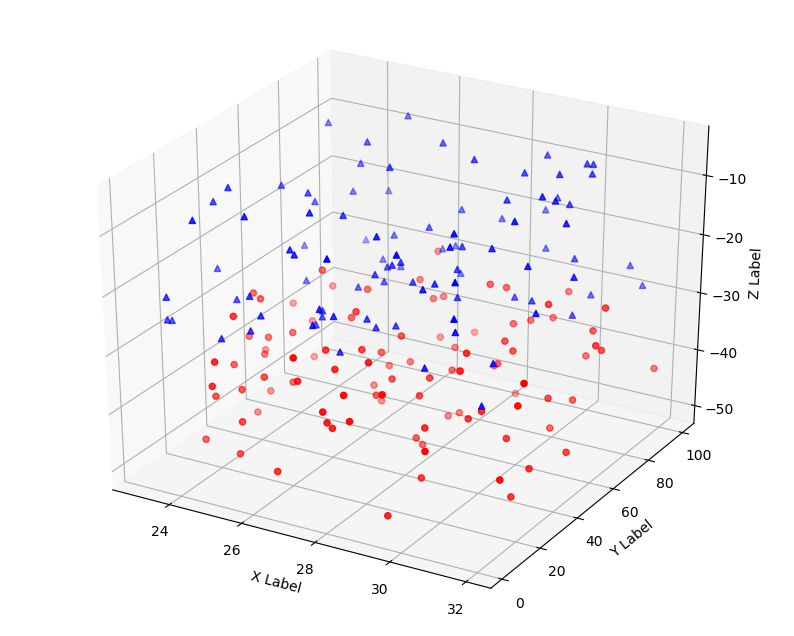

In [27]:
# Cambiando de estilo 
plt.style.use('default')

# Importando e submodulo para graficas 3D
from mpl_toolkits.mplot3d import Axes3D

# Creando datos aleatorios
n = 100
def randrange(n, vmin, vmax):
    return (vmax-vmin)*np.random.rand(n) + vmin

# Creando la figura 
fig = plt.figure(figsize=(10,8))

ax = fig.add_subplot(111, projection='3d')

for c, m, zl, zh in [('r', 'o', -50, -25), ('b', '^', -30, -5)]:
    xs = randrange(n, 23, 32)
    ys = randrange(n, 0, 100)
    zs = randrange(n, zl, zh)
    ax.scatter(xs, ys, zs, c=c, marker=m)

ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

plt.show()

Al igual que las figuras **2D**, estas figuras **3D** se pueden personalizar de forma diversa, siguiendo las mismas propiedades anteriormente vistas. Veamos ahora otra visualización, sin embargo la documentación nos da un vistazo a todas las posbilidades: https://matplotlib.org/3.1.0/api/toolkits/mplot3d.html

(-100, 100)

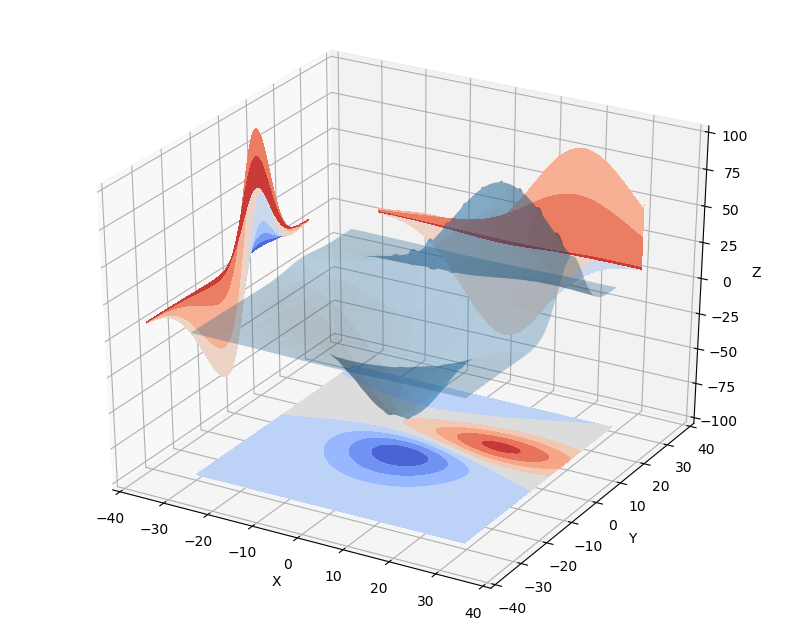

In [28]:
from mpl_toolkits.mplot3d import axes3d
from matplotlib import cm

fig = plt.figure(figsize=(10,8))
ax = fig.gca(projection='3d')
X, Y, Z = axes3d.get_test_data(0.05)
ax.plot_surface(X, Y, Z, rstride=8, cstride=8, alpha=0.3)
cset = ax.contourf(X, Y, Z, zdir='z', offset=-100, cmap=cm.coolwarm)
cset = ax.contourf(X, Y, Z, zdir='x', offset=-40, cmap=cm.coolwarm)
cset = ax.contourf(X, Y, Z, zdir='y', offset=40, cmap=cm.coolwarm)

ax.set_xlabel('X')
ax.set_xlim(-40, 40)
ax.set_ylabel('Y')
ax.set_ylim(-40, 40)
ax.set_zlabel('Z')
ax.set_zlim(-100, 100)


## `seaborn`

Como hemos visto **`Python`** es muy versátil para la creación de visualizaciones, sin embargo hasta el momento vemos a que través del módulo `matplotlib` puede resultar trabajoso y extenso. El módulo `seaborn` es una respuesta a esta necesidad, ya que presenta muchas de las funcionalidades vistas anteriormente pero accesibles de forma mas facil y especialmente enfocada para el análisis exploratorio de datos. Veamos algunas de sus herramientas.

### Diagrama de dispersión multivariado - `pairplot`

Anteriormente vimos los diagramas de dispersión para analizar la variación conjunta de dos variables en **2D** o **3D**. Esto resulta bien para analizar un conjunto de datos con pocas variables, sin embargo, qué podemos hacer cuándo tenemos muchas variables: 


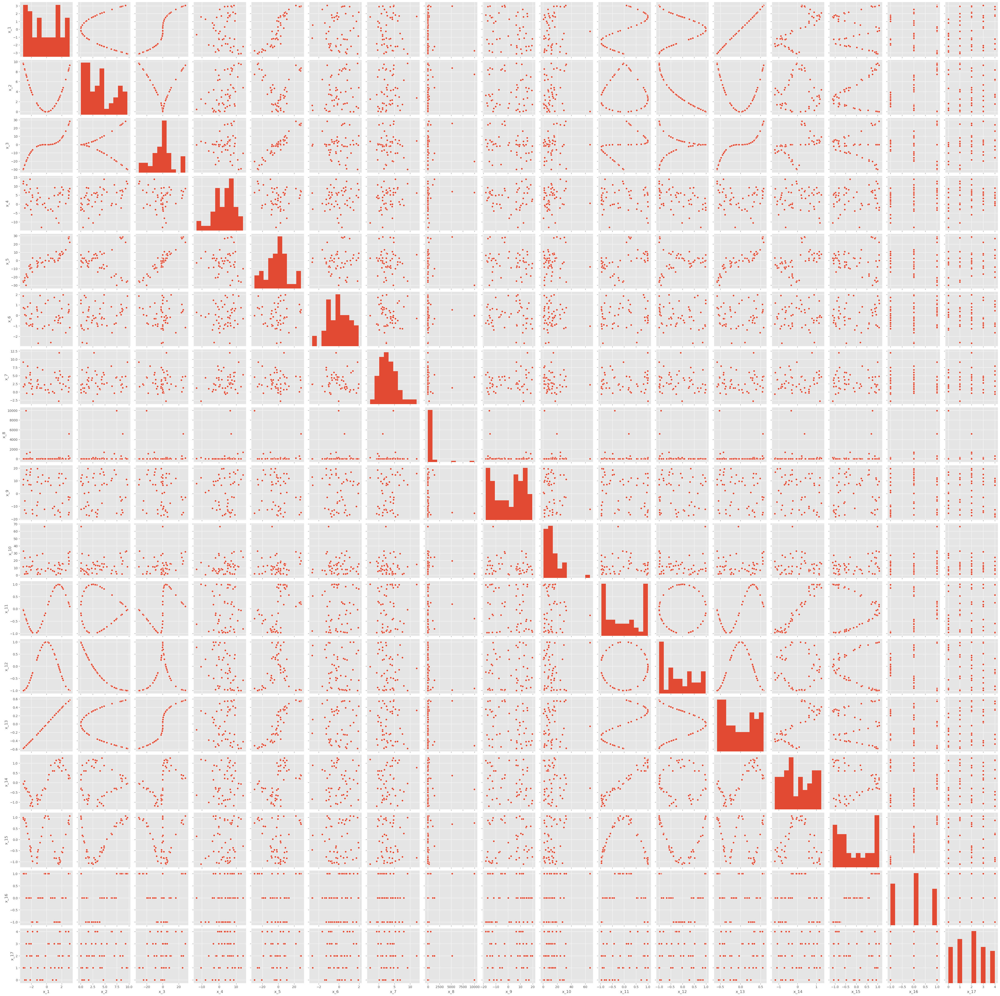

In [29]:
import seaborn as sb
plt.style.use('ggplot')
sb.pairplot(datos.sample(50,random_state=19))

Hemos graficado un diagrama de dispersión para todas las variables del data set. Este diagrama nos permite mostrar las relaciones entre todo el data set y recuperar patrones complejos alojados de la información. Aquí hemos usado solo una muestra del data set, ya que al tener un número de observaciones muy grande, el diagrama puede tomar mucho tiempo en generar. 

En el caso de personalización, `seaborn` incluye muchas de las opciones en el mismo comando:

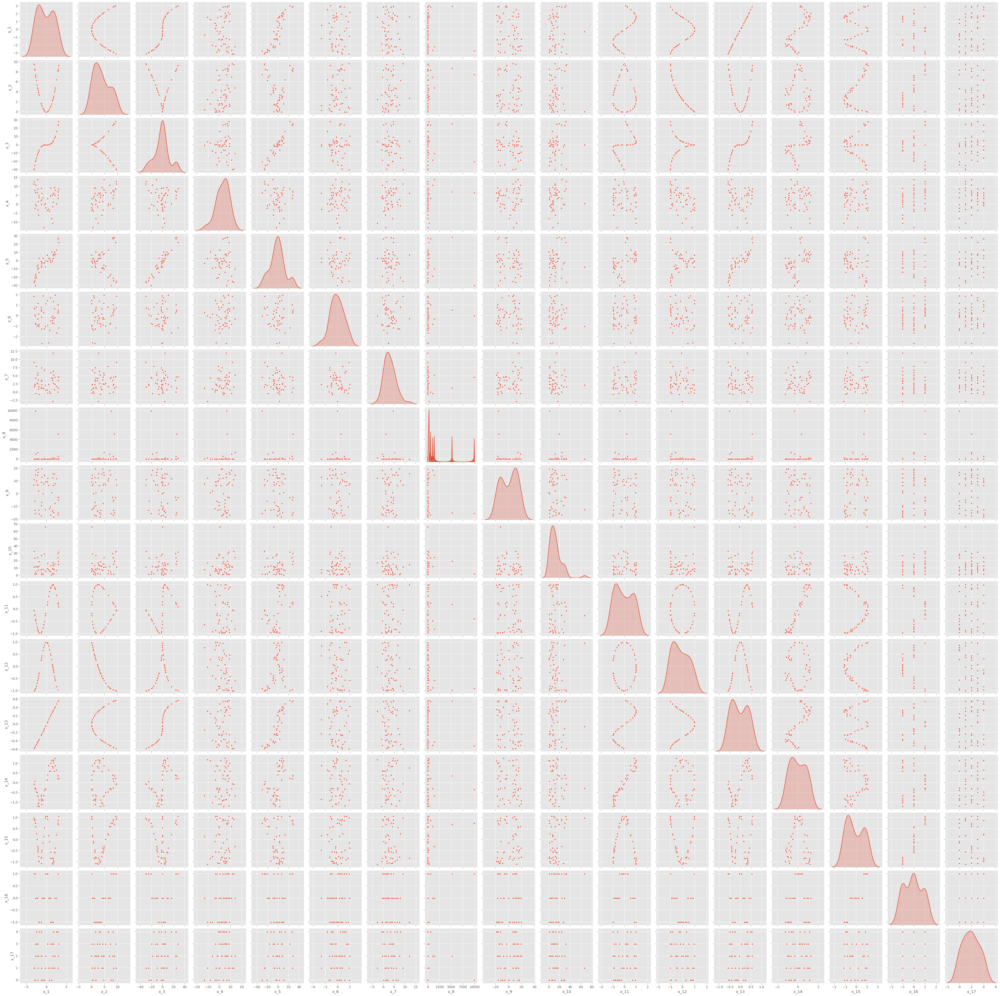

In [30]:
sb.pairplot(datos.sample(50,random_state=19),diag_kind='kde',markers='^')

Cuando tenemos un variable categórica, podemos hacer el diagrama para comparar entre los conjuntos de datos que esta categoría representa.

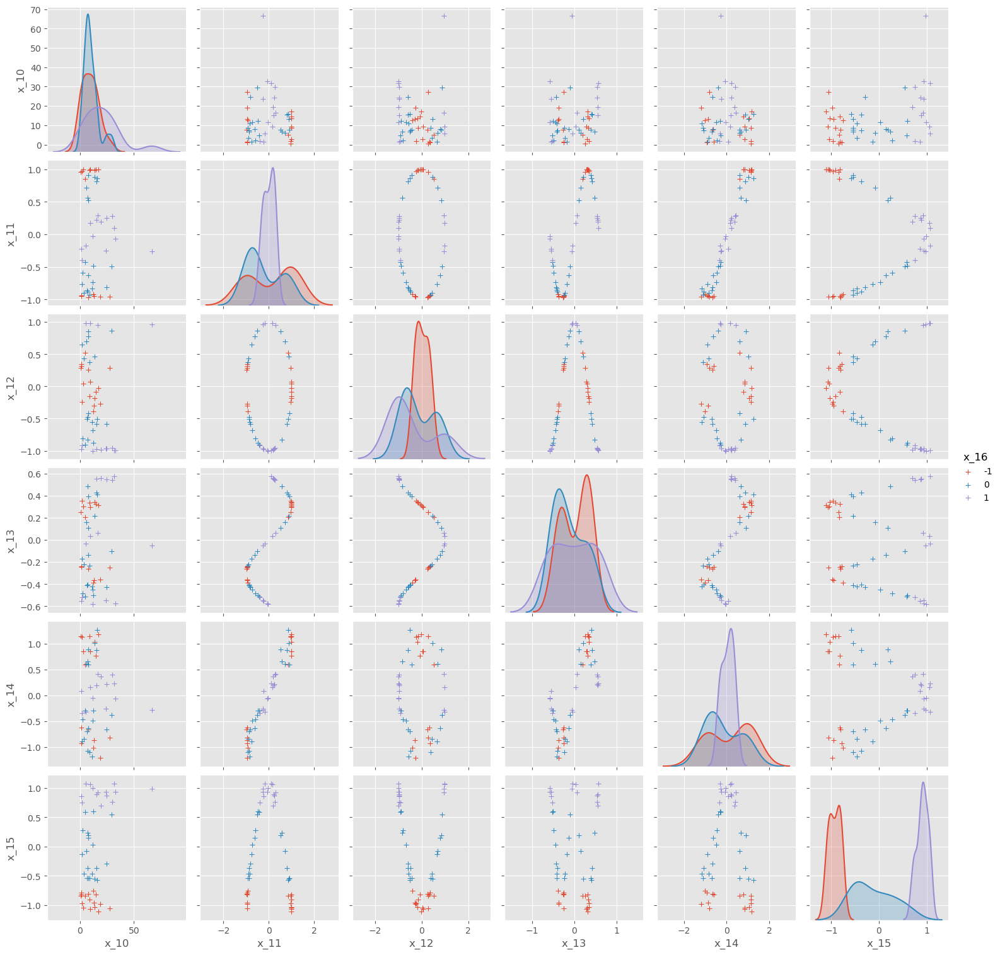

In [31]:
sb.pairplot(datos.sample(50,random_state=19)[['x_10','x_11','x_12','x_13','x_14','x_15','x_16']],hue='x_16',diag_kind='kde',markers='+')

### `jointplot` 

Este diagrama es la unión entre un diagrama de dispersión y un histograma.

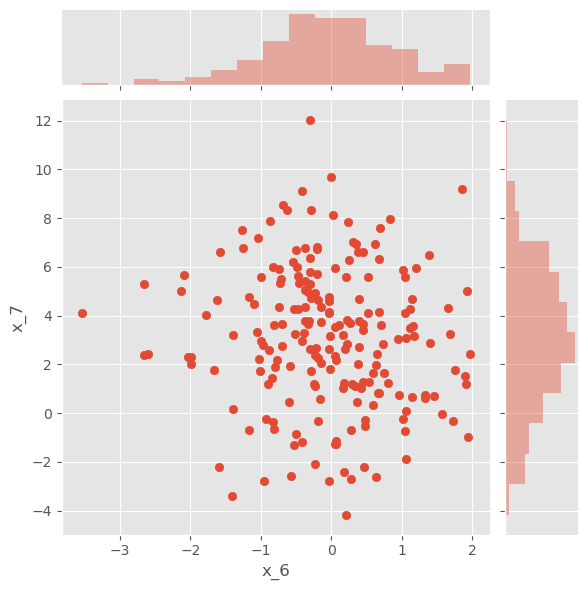

In [32]:
sb.jointplot(datos['x_6'],datos['x_7'])

Tambión podemos cambiar el diagrama de dispersión por una gráfica de densidad del kernel 

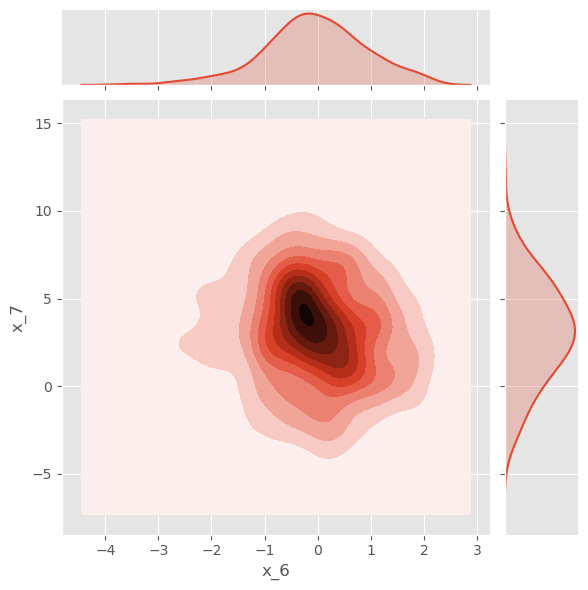

In [33]:
sb.jointplot(datos['x_6'],datos['x_7'],kind='kde')

Del mismo modo, podemos usar la opcion `kind` para represntar una regresión lineal en nuestro diagrama:

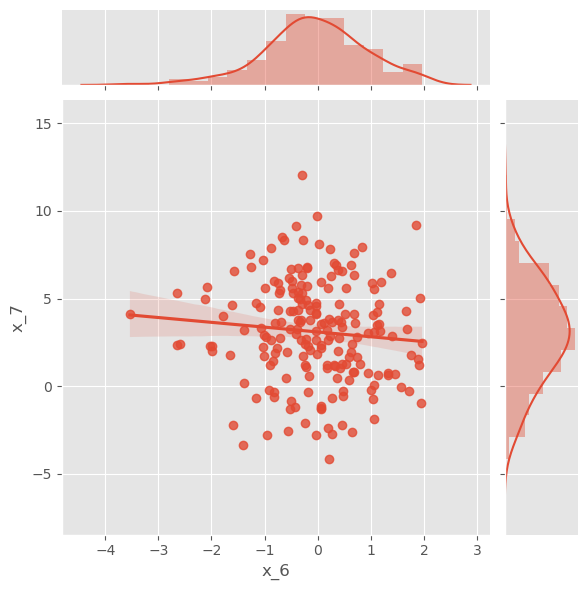

In [34]:
sb.jointplot(datos['x_6'],datos['x_7'],kind='reg')

### `lineplot`

`lineplot` nos permite representar la relación entre dos variables usando líneas 

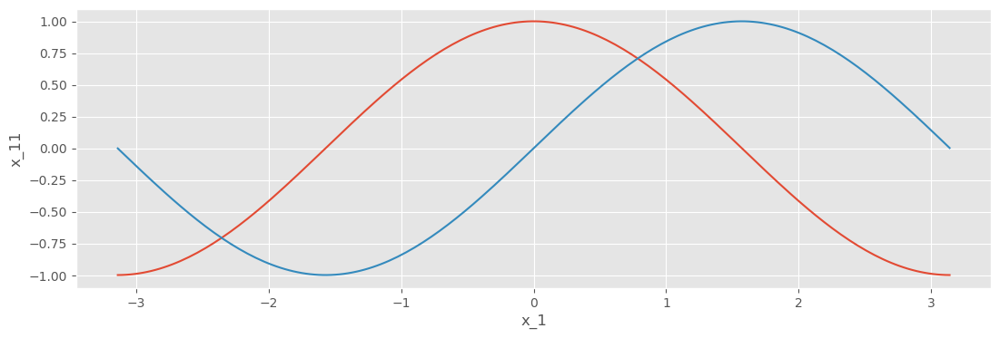

In [35]:
plt.figure(figsize=(13,4))
sb.lineplot(data=datos,x="x_1", y="x_12")
sb.lineplot(data=datos,x="x_1", y="x_11")

### Mapa de calor - `heatmap`

Los mapas de calor tienen gran número de aplicaciones en contexto de sistemas físicos, campo donde surgieron. Sin embargo en la actualidad y para nuestro proposito han encontrado una funcionalidad particular, analisis y representacion de correlaciones.

Creemos primero un ejemplo con información aleatoria:

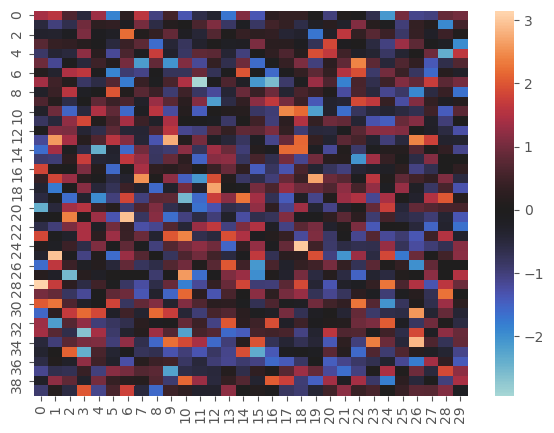

In [36]:
# Creación de data aleatoria 
normal_data = np.random.randn(40, 30)

# Creación de figura 
fig = plt.figure(figsize=(7,5)) 
ax = sb.heatmap(normal_data, center=0)

Ahora, analicemos nuestro data set de ejemplo:

In [37]:
# Creamos la matriz de correlación con Pandas
correlacion = datos.corr()
correlacion.head()

,x_1,x_2,x_3,x_4,x_5,x_6,x_7,x_8,x_9,x_10,x_11,x_12,x_13,x_14,x_15,x_16,x_17
x_1,1.000000e+00,7.552797e-17,9.165304e-01,0.009075,0.871948,0.013899,-0.003382,-0.044362,0.016540,0.021152,7.744092e-01,-1.650900e-16,9.998434e-01,0.753071,0.003586,-0.005285,-0.024800
x_2,7.552797e-17,1.000000e+00,3.264095e-16,0.379544,-0.003699,0.017789,0.060646,0.028212,0.058702,0.068671,-4.488210e-17,-9.603163e-01,2.349545e-16,0.020181,0.246580,0.236259,0.098302
x_3,9.165304e-01,3.264095e-16,1.000000e+00,0.050060,0.947951,-0.018271,-0.036866,-0.023628,0.030044,0.052485,4.596268e-01,-4.115114e-16,9.093100e-01,0.450506,0.000985,-0.015714,0.018094
x_4,9.074779e-03,3.795443e-01,5.006032e-02,1.000000,0.063154,-0.026245,0.178179,0.042063,0.045824,0.035010,-6.003927e-02,-3.585818e-01,7.225518e-03,-0.028291,0.114071,0.138947,0.074389
x_5,8.719477e-01,-3.699158e-03,9.479509e-01,0.063154,1.000000,-0.011671,-0.051653,-0.041904,0.024586,0.016041,4.451558e-01,5.011393e-03,8.652315e-01,0.440427,0.006200,-0.017389,0.002895


Como vemos, no es fácil ver los patrones de la data usando la tabla de correlaciones, pero si usamos un mapa de calor podemos: 

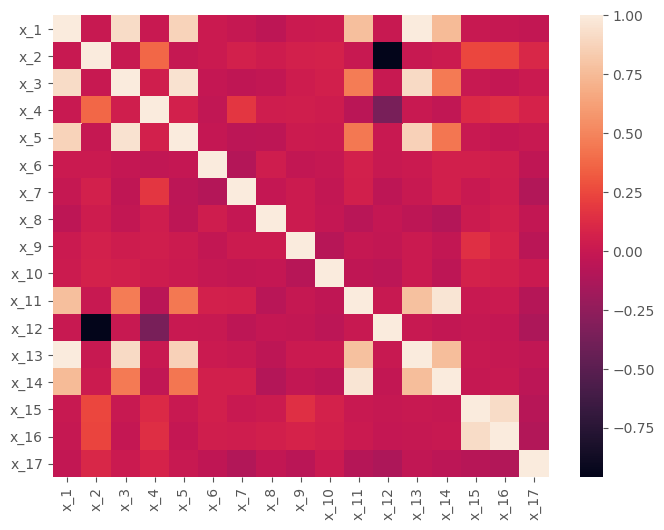

In [38]:
fig = plt.figure(figsize=(8,6)) 
sb.heatmap(correlacion)

Si queremos ver los valores de cada correlación:

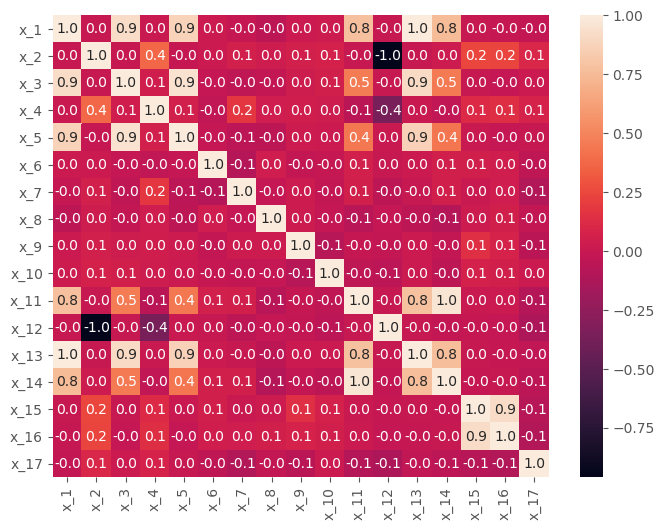

In [39]:
fig = plt.figure(figsize=(8,6)) 
sb.heatmap(correlacion,annot=correlacion,fmt='.1f')

O incluir un espacio blanco entre cada casilla y eliminar la barra de escala:

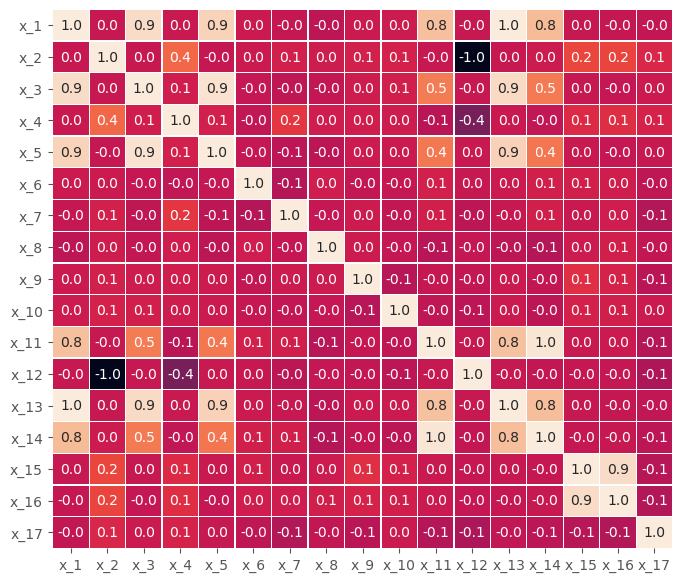

In [40]:
fig = plt.figure(figsize=(8,7)) 
sb.heatmap(correlacion,annot=correlacion,fmt='.1f',linewidth=0.2,cbar=False)

También podemos usar un diferente mapa de colores

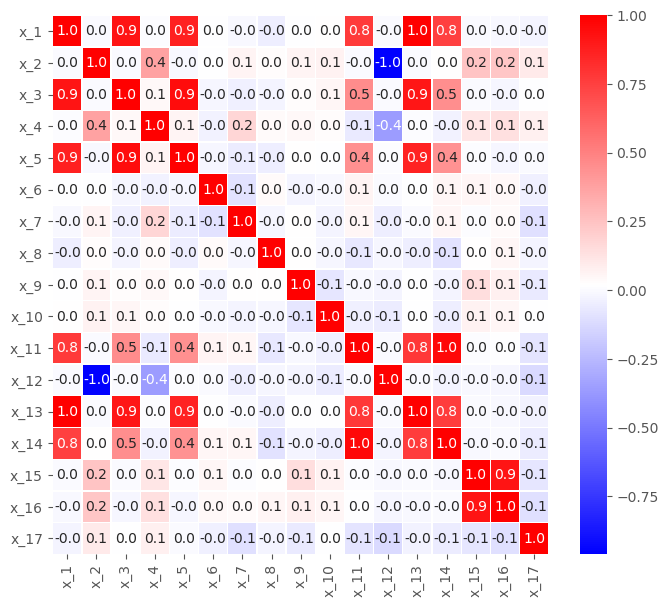

In [41]:
fig = plt.figure(figsize=(8,7)) 
sb.heatmap(correlacion,annot=correlacion,fmt='.1f',linewidth=0.2,cmap='bwr')

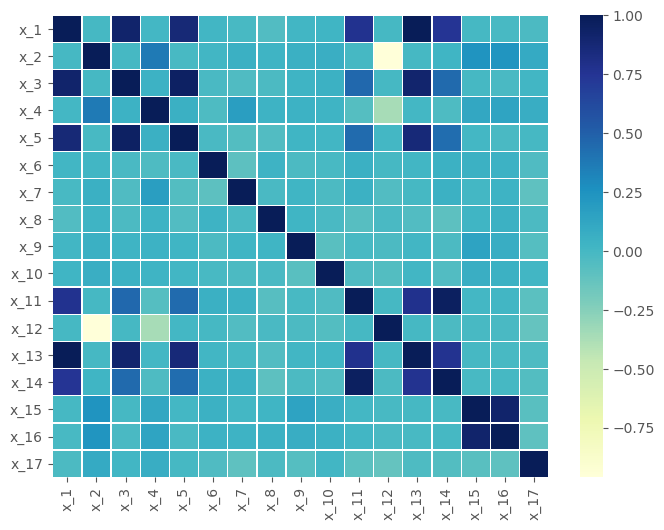

In [42]:
# Otra vez con valores aleatorios
normal_data = np.random.randn(10, 12)

# Creamos la figura
fig = plt.figure(figsize=(8,6)) 
sb.heatmap(correlacion,linewidth=0.2,cmap='YlGnBu')

### Análisis de cuartiles 

Vimos en la sesión teórica cómo el concepto de cuartiles puede ser ampliamente usado para entender la distribución de una variable. A continuación veremos 3 funciones que permiten reprensetar este concepto de forma total o parcial, iniciando por el diagrama `boxplot`. 

### Diagrama de cajas - `boxplot`

Recordemos que el diagrama de `boxplot` nos permite representar gráficamente los cuartiles de una distribución y adicionalmente posibles outliers de en la data. 

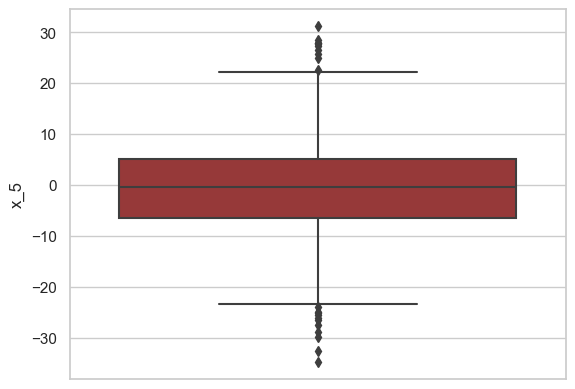

In [43]:
sb.set(style="whitegrid")
sb.boxplot(y=datos["x_5"],color='brown')

Adicionalmente podemos generar el diagrama segmentado por otra variable categórica.   

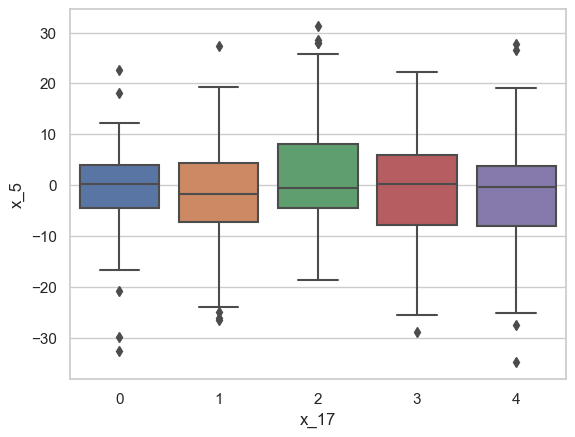

In [44]:
sb.boxplot(x="x_17", y="x_5", data=datos)

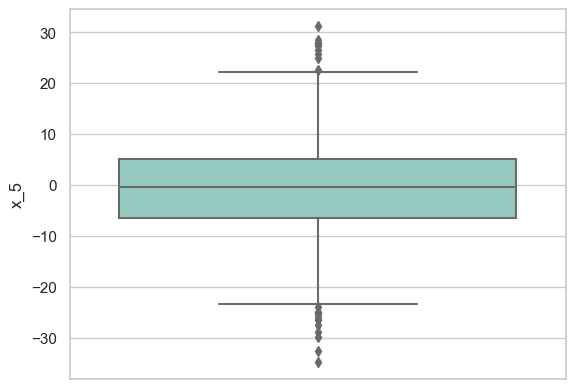

In [45]:
sb.boxplot(y='x_5', hue="x_16", data=datos, palette="Set3")

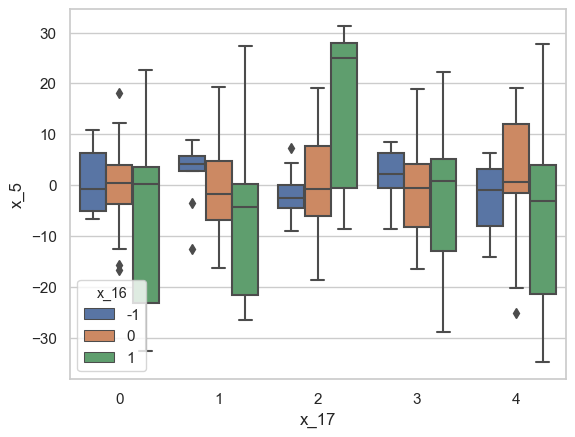

In [46]:
sb.boxplot(x="x_17", y="x_5", hue='x_16', data=datos)

### Diagrama de violines - `violinplot`

A continuación veremos el diagrama de violines, que funciona de forma similar al anterior pero nos da mas información de la distribución y no solo algunos valores de referencia. Veamos los mismo ejemplos, pero en esta nueva funcionalidad:

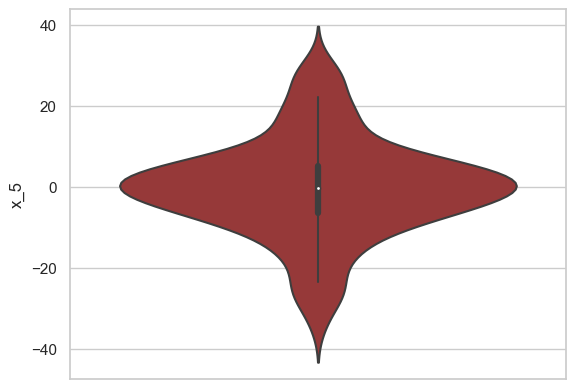

In [47]:
sb.violinplot(y=datos["x_5"],color='brown')

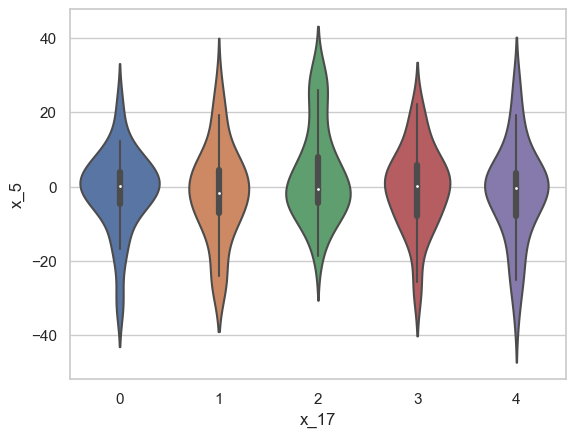

In [48]:
sb.violinplot(x="x_17", y="x_5", data=datos)

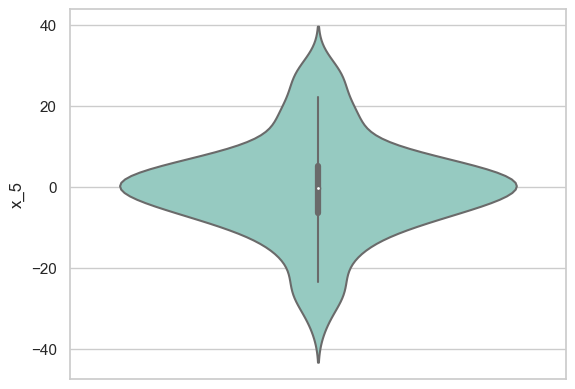

In [49]:
sb.violinplot(y='x_5', hue="x_16", data=datos, palette="Set3")

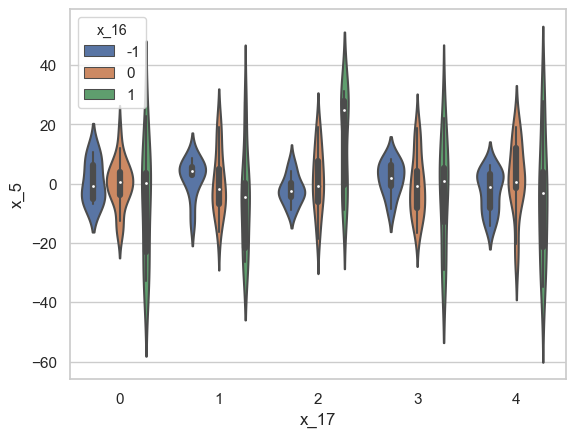

In [50]:
sb.violinplot(x="x_17", y="x_5", hue='x_16', data=datos)

### Diagrama de enjambre - `sawrmplot`

Por último, tenemos el diagrama de enjambre como una forma alternativa de representar la distribución. Aquí nos enfocamos en visualizar cada observación como un punto de información. Nuevamente, veamos los mismo ejemplos, pero en esta nueva funcionalidad:

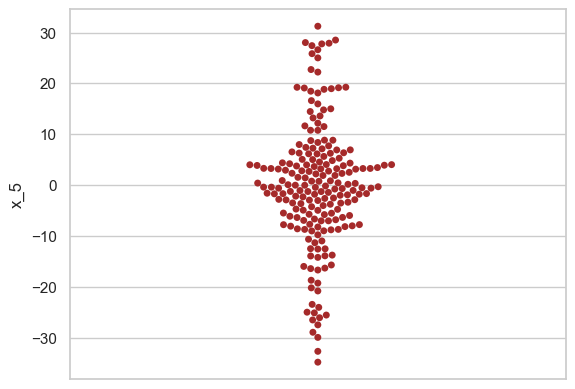

In [51]:
sb.swarmplot(y=datos["x_5"],color='brown')

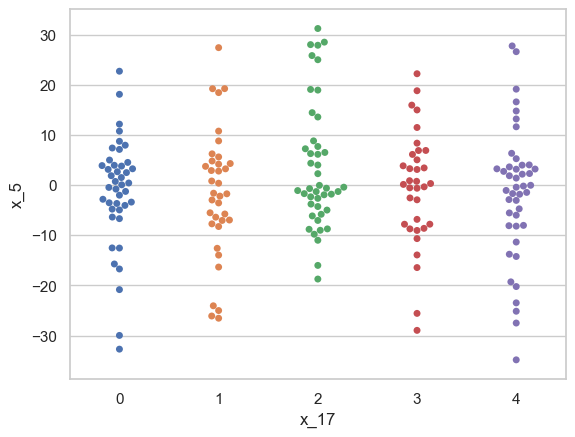

In [52]:
sb.swarmplot(x="x_17", y="x_5", data=datos)

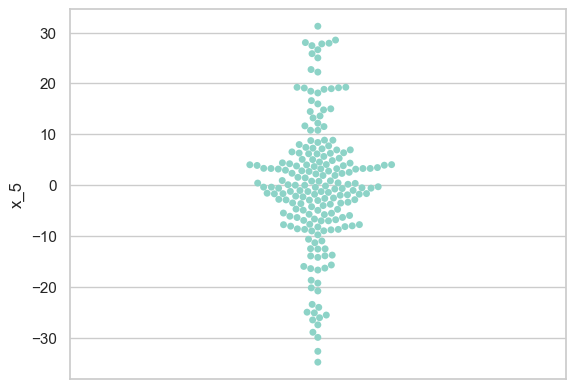

In [53]:
sb.swarmplot(y='x_5', hue="x_16", data=datos, palette="Set3")

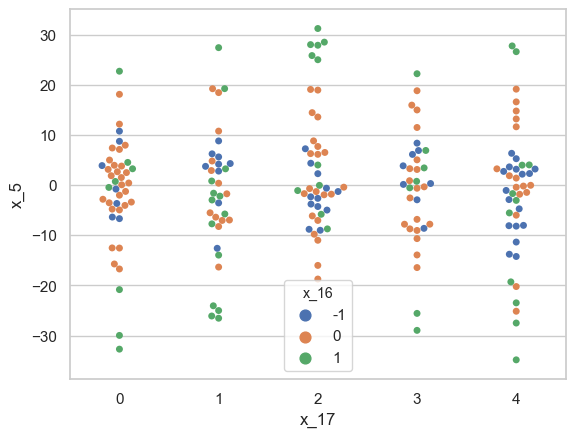

In [54]:
sb.swarmplot(x="x_17", y="x_5", hue='x_16', data=datos)

### Combinando diagramas

Como es de esperarse, la personalización es una alternativa clara de `Python`, por lo que podemos combinar herramientas:

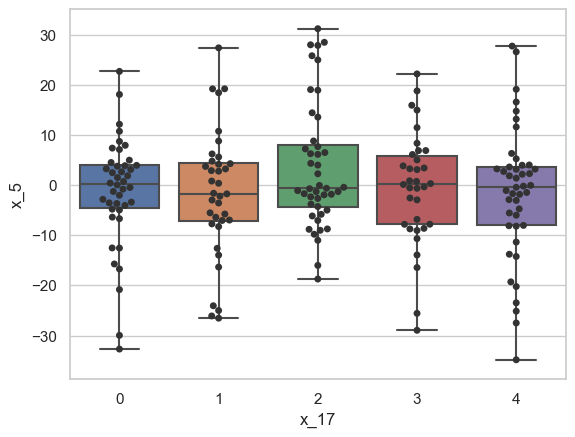

In [55]:
sb.boxplot(x="x_17", y="x_5", data=datos, whis=np.inf)
sb.swarmplot(x="x_17", y="x_5", data=datos, color=".2")

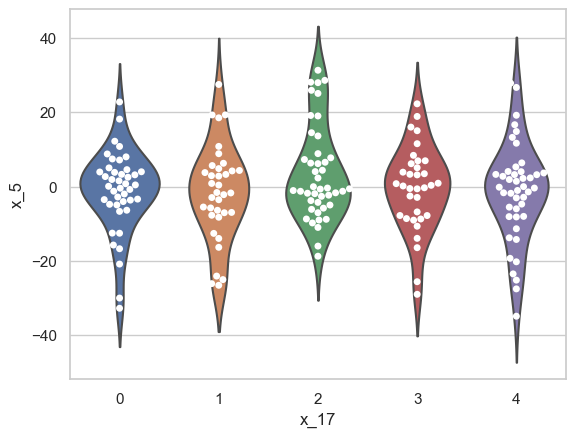

In [56]:
sb.violinplot(x="x_17", y="x_5", data=datos, inner=None)
sb.swarmplot(x="x_17", y="x_5", data=datos, color="white", edgecolor="gray")

## Visualizaciones interactivas con `plotly`

Hasta el momento hemos visto que el uso y creación de visualizaciones en `Python` es sencillo y variado. Sin embargo la todas han sido estáticas. Cuando queremos crear visualizaciones dinámicas `Plotly` es la alternativa ideal en `Python`.

Para empezar importamos las librias necesarias:

In [57]:
import plotly.offline as py
import plotly.graph_objects as go

py.init_notebook_mode(connected=False)
%load_ext nb_black

<IPython.core.display.Javascript object>

Para saber de que se trata `Plotly`, que mejor que un ejemplo:

In [58]:
# Importamos los datos
z_data = pd.read_csv(
    "https://raw.githubusercontent.com/plotly/datasets/master/api_docs/mt_bruno_elevation.csv"
)

# Iniciamos la figura
fig = go.Figure(data=[go.Surface(z=z_data.values)])

#
fig.update_traces(
    contours_z=dict(
        show=True, usecolormap=True, highlightcolor="limegreen", project_z=True,
    )
)

# El layout define el aspecto de nuestra marco y figura
fig.update_layout(
    title="Efecto Wooooowww!",
    autosize=False,
    width=900,
    height=600,
    margin=dict(l=20, r=10, b=10, t=40),
)

fig.show()

<IPython.core.display.Javascript object>

### ¿Cómo funciona?

Los objetos de `Plotly` consisten de una o mas componentes de data y un layout. Cada uno tiene subcomponentes. La mayor parte del formato se controla en el layoput.

### Diagrama de barras

Veamos como podemos crear un diagrama de barras en `Plotly`:

In [59]:
fig = go.Figure()

fig.add_trace(go.Bar(x=["Manzanas", "Naranjas", "Melones", "Peras"], y=[3, 2, 1, 4]))

fig.update_layout(
    title_text="Diagrama de barras 101<br>Desplazar por la gráfica para ver detalle",
    xaxis_title="Eje x",
    yaxis_title="Eje y",
    autosize=False,
    width=500,
    height=500,
)

fig.update_yaxes(automargin=True)

fig.show()

<IPython.core.display.Javascript object>

In [60]:
x = ["Producto A", "Producto B", "Producto C", "Producto D"]
y = [20, 14, 23, 19]

# Usar el argumento hovertext para editar el texto de detalle
fig = go.Figure(
    data=[
        go.Bar(
            x=x,
            y=y,
            hovertext=[
                "20% porcentaje de mercado",
                "14% porcentaje de mercado",
                "23% porcentaje de mercado",
                "19% porcentaje de mercado",
            ],
        )
    ]
)

fig.update_layout(
    title_text="Diagrama de Barras<br>Desplazate por la gráfica para ver el texto personalizado",
    autosize=False,
    width=500,
    height=500,
)
fig.show()

<IPython.core.display.Javascript object>

In [61]:
months = [
    "Ene",
    "Feb",
    "Mar",
    "Abr",
    "May",
    "Jun",
    "Jul",
    "Ago",
    "Sep",
    "Oct",
    "Nov",
    "Dic",
]

fig = go.Figure()

fig.add_trace(
    go.Bar(
        x=months,
        y=[20, 14, 25, 16, 18, 22, 19, 15, 12, 16, 14, 17],
        name="Producto primario",
        marker_color="blue",
    )
)

fig.add_trace(
    go.Bar(
        x=months,
        y=[19, 14, 22, 14, 16, 19, 15, 14, 10, 12, 12, 16],
        name="Producto secundario",
        marker_color="navy",
    )
)

fig.update_layout(
    barmode="group",
    xaxis_tickangle=-45,
    title_text="Diagrama de barras<br>Barras agrupadas",
    autosize=False,
    width=800,
    height=500,
)

fig.show()

<IPython.core.display.Javascript object>

In [62]:
x = [1, 2, 3, 4]
fig = go.Figure()
fig.add_trace(go.Bar(x=x, y=[1, 4, 9, 16]))
fig.add_trace(go.Bar(x=x, y=[6, -8, -4.5, 8]))
fig.add_trace(go.Bar(x=x, y=[-15, -3, 4.5, -8]))
fig.add_trace(go.Bar(x=x, y=[-1, 3, -3, -4]))
fig.update_layout(
    barmode="relative",
    title_text="Diagrama de barras relativo",
    autosize=False,
    width=500,
    height=500,
)
fig.show()

<IPython.core.display.Javascript object>

### Diagrama de líneas

In [63]:
fig = go.Figure()
fig.add_trace(
    go.Scatter(
        x=[0, 1, 2, 3, 4, 5, 6, 7, 8],
        y=[0, 1, 2, 3, 4, 5, 6, 7, 8],
        name="Nombre de la traza 1",
    )
)
fig.add_trace(
    go.Scatter(
        x=[0, 1, 2, 3, 4, 5, 6, 7, 8],
        y=[1, 0, 3, 2, 5, 4, 7, 6, 8],
        name="Nombre de la traza 2",
    )
)
fig.update_layout(
    title_text="Diagrama de líneas<br>(Seleccionar las etiquetas)",
    xaxis_title="Eje x",
    yaxis_title="Eje y",
    autosize=False,
    width=800,
    height=500,
)
fig.show()

<IPython.core.display.Javascript object>

In [64]:
np.random.seed(66)
N = 100

random_x = np.linspace(0, 1, N)
random_y0 = np.random.randn(N) + 5
random_y1 = np.random.randn(N)
random_y2 = np.random.randn(N) - 5

fig = go.Figure()

fig.add_trace(go.Scatter(x=random_x, y=random_y0, mode="lines", name="línea"))
fig.add_trace(
    go.Scatter(x=random_x, y=random_y1, mode="lines+markers", name="línea+marcadores")
)
fig.add_trace(go.Scatter(x=random_x, y=random_y2, mode="markers", name="marcadores"))

fig.update_layout(
    title_text="Diagrama de líneas<br>(Multiples trazas con diferentes marcadores)",
    xaxis_title="Eje x",
    yaxis_title="Eje y",
    autosize=False,
    width=800,
    height=500,
)
fig.show()

<IPython.core.display.Javascript object>

### Diagramas de dispersión

In [65]:
N = 1000
t = np.linspace(0, 10, 100)
y = np.sin(t)

fig = go.Figure(data=go.Scatter(x=t, y=y, mode="markers"))

fig.update_layout(
    title_text="Diagrama de dispersión (estilo plotly)",
    template="plotly",
    autosize=False,
    margin=dict(l=10, r=10, b=10, t=50),
)

fig.show()

<IPython.core.display.Javascript object>

In [66]:
fig = go.Figure(data=go.Scatter(x=t, y=y, mode="markers"))
fig.update_layout(
    title_text="Diagrama de dispersión (estilo plotly_white)",
    template="plotly_white",
    autosize=False,
    margin=dict(l=10, r=10, b=10, t=50),
)
fig.show()

<IPython.core.display.Javascript object>

In [67]:
fig = go.Figure(data=go.Scatter(x=t, y=y, mode="markers"))
fig.update_layout(
    title_text="Diagrama de dispersión (estilo plotly_dark)",
    template="plotly_dark",
    autosize=False,
    margin=dict(l=10, r=10, b=10, t=50),
)
fig.show()

<IPython.core.display.Javascript object>

In [68]:
fig = go.Figure(data=go.Scatter(x=t, y=y, mode="markers"))
fig.update_layout(
    title_text="Diagrama de dispersión (estilo ggplot)",
    template="ggplot2",
    autosize=False,
    margin=dict(l=10, r=10, b=10, t=50),
)
fig.show()

<IPython.core.display.Javascript object>

In [69]:
fig = go.Figure(data=go.Scatter(x=t, y=y, mode="markers"))
fig.update_layout(
    title_text="Diagrama de dispersión (estilo seaborn)",
    template="seaborn",
    autosize=False,
    margin=dict(l=10, r=10, b=10, t=50),
)
fig.show()

<IPython.core.display.Javascript object>

In [70]:
fig = go.Figure(
    data=go.Scatter(
        y=np.random.randn(500),
        mode="markers",
        marker=dict(
            size=16,
            color=np.random.randn(500),  # Asignar color iguala a una variable
            colorscale="Viridis",  # Escala de colores de plotly
            showscale=True,
        ),
    )
)

fig.update_layout(
    title_text="Diagrama de dispersión<br>(Color definido por una variable)",
    xaxis_title="Eje x",
    yaxis_title="Eje y",
    autosize=False,
    width=800,
    height=500,
)
fig.show()


<IPython.core.display.Javascript object>

### Histogramas

In [71]:
x0 = np.random.randn(500)
x1 = np.random.randn(500) + 1

fig = go.Figure()

fig.add_trace(go.Histogram(x=x0, name="Distribución 1",))
fig.add_trace(go.Histogram(x=x1, name="Distribución 2",))

fig.update_layout(
    barmode="overlay", title_text="Histogramas", autosize=False, width=800, height=500,
)
fig.update_traces(opacity=0.75)
fig.show()

<IPython.core.display.Javascript object>

### Box plots

In [72]:
np.random.seed(66)

y0 = np.random.randn(50) - 1
y1 = np.random.randn(50) + 1
y2 = np.random.randn(50) + 2

fig = go.Figure()

fig.add_trace(go.Box(y=y0))
fig.add_trace(go.Box(y=y1))
fig.add_trace(go.Box(y=y2))

fig.update_layout(
    title_text="Diagrama de cajas<br>(Ver detalles sobre la gráfica)",
    autosize=False,
    width=800,
    height=500,
)

fig.show()

<IPython.core.display.Javascript object>

### Heatmap

In [73]:
fig = go.Figure(
    data=go.Heatmap(
        z=[[1, None, 30, 50, 1], [20, 1, 60, 80, 30], [30, 60, 1, -10, 20]],
        x=["Lunes", "Martes", "Miercoles", "Jueves", "Viernes"],
        y=["Día", "Tarde", "Noche"],
        hoverongaps=False,
        colorscale="Viridis",
    )
)

fig.update_layout(
    title_text="Mapa de calor<br>(Ver detalles sobre la gráfica)",
    autosize=False,
    width=800,
    height=500,
)

fig.show()

<IPython.core.display.Javascript object>

### Subplots

In [74]:
from plotly.subplots import make_subplots

fig = make_subplots(
    rows=2, cols=2, subplot_titles=("Gráfica 1", "Gráfica 2", "Gráfica 3", "Gráfica 4")
)

fig.add_trace(go.Scatter(x=[1, 2, 3], y=[4, 5, 6]), row=1, col=1)
fig.add_trace(go.Scatter(x=[20, 30, 40], y=[50, 60, 70]), row=1, col=2)
fig.add_trace(go.Scatter(x=[300, 400, 500], y=[600, 700, 800]), row=2, col=1)
fig.add_trace(go.Scatter(x=[4000, 5000, 6000], y=[7000, 8000, 9000]), row=2, col=2)

fig.update_layout(title_text="Subplots con títulos", height=500, width=700)

fig.show()

<IPython.core.display.Javascript object>

In [75]:
fig = make_subplots(rows=1, cols=2, column_widths=[0.7, 0.3])

fig.add_trace(go.Scatter(x=[1, 2, 3], y=[4, 5, 6]), row=1, col=1)
fig.add_trace(go.Scatter(x=[20, 30, 40], y=[50, 60, 70]), row=1, col=2)

fig.update_layout(title_text="Subplots de diferentes tamaños", height=500, width=700)

fig.show()

<IPython.core.display.Javascript object>

### Gráficas 3D

In [76]:
z_data = pd.read_csv(
    "https://raw.githubusercontent.com/plotly/datasets/master/api_docs/mt_bruno_elevation.csv"
)

fig = go.Figure(data=go.Surface(z=z_data.values),)

fig.update_layout(
    title="Gráfica de superficie",
    width=800,
    height=500,
    margin=dict(l=10, r=10, b=10, t=40),
)

fig.show()

<IPython.core.display.Javascript object>

In [77]:
t = np.linspace(0, 20, 100)
x, y, z = np.cos(t), np.sin(t), t

fig = go.Figure(
    data=[
        go.Scatter3d(
            x=x, y=y, z=z, mode="markers", marker=dict(size=12, color=z, opacity=0.8)
        )
    ]
)


fig.update_layout(
    title="Diagrama de dispersión 3D",
    width=800,
    height=500,
    margin=dict(l=10, r=10, b=10, t=40),
)

fig.show()

<IPython.core.display.Javascript object>

### Subplots 3D

In [78]:
# ¿Cómo cambiar la fuente?
fig = make_subplots(
    rows=2,
    cols=2,
    specs=[
        [{"type": "polar"}, {"type": "scene", "rowspan": 2}],
        [{"type": "xy"}, None],
    ],
)
fig.add_trace(go.Bar(y=[2, 3, 1]), row=2, col=1)
fig.add_trace(go.Barpolar(theta=[0, 45, 90], r=[2, 3, 1]), row=1, col=1)
t = np.linspace(0, 20, 100)
fig.add_trace(go.Scatter3d(x=np.cos(t), y=np.sin(t), z=t, mode="markers"), row=1, col=2)
fig.show()

<IPython.core.display.Javascript object>

### Mapas

In [79]:
df = pd.read_csv(
    "https://raw.githubusercontent.com/plotly/datasets/master/2011_us_ag_exports.csv"
)

fig = go.Figure(
    data=go.Choropleth(
        locations=df["code"],  # coordenadas geoespaciales
        z=df["total exports"].astype(float),
        locationmode="USA-states",
        colorscale="Viridis",
        marker_line_color="white",
        colorbar_title="Milliones de USD",
    )
)

fig.update_layout(
    title_text="Mapa de EEUU",
    geo_scope="usa",  # Limitar a USA
    width=800,
    height=500,
)

fig.show()

<IPython.core.display.Javascript object>

In [80]:
quakes = pd.read_csv(
    "https://raw.githubusercontent.com/plotly/datasets/master/earthquakes-23k.csv"
)

fig = go.Figure(
    go.Densitymapbox(
        lat=quakes.Latitude, lon=quakes.Longitude, z=quakes.Magnitude, radius=10,
    )
)

fig.update_layout(
    title_text="Mapa de densidad de terremotos",
    mapbox_style="open-street-map",
    mapbox_center_lon=180,
    margin={"r": 10, "t": 40, "l": 10, "b": 10},
    width=800,
    height=500,
)

fig.show()

<IPython.core.display.Javascript object>

### ¿Cómo guardamos los resutaldos?

In [81]:
from plotly import offline

offline.plot(fig, filename="plotly.html", auto_open=False)

'plotly.html'

<IPython.core.display.Javascript object>

In [82]:
!rm pl

rm: pl: No such file or directory


<IPython.core.display.Javascript object>

### Recursos y otras fuentes 

El contenido ha sido desarrollado con el input de los instructores y equipo de McKinsey mas los siguientes recursos externos:

* Visualización de datos con `Plotly`: https://nbviewer.jupyter.org/github/simontamayo/plotly_dataviz/blob/master/plotly_dataviz.ipynb

* Tutorial de para `Plotly`: https://nbviewer.jupyter.org/github/simontamayo/plotly_dataviz/blob/master/plotly_dataviz.ipynb

* Tutorial de `matplotlib`: https://matplotlib.org/3.1.0/api/toolkits/mplot3d.html, https://matplotlib.org/3.2.1/tutorials/introductory/usage.html

* API de referencia de `seaborn`: https://seaborn.pydata.org/api.html

## FIN